[<img src="https://github.com/lourencocavalcante/LogosINPE/blob/main/logoinpe.png?raw=true" width = 500 align="left">](https://www.gov.br/inpe/pt-br)

[<img src="https://github.com/lourencocavalcante/LogosINPE/blob/main/LogoCAP.png?raw=true" width = 300 align="right">](http://www.inpe.br/posgraduacao/cap/)

# **CAP-730 Aprendizado Profundo (*Deep Leraning*)**
## **OTIMIZANDO REDES NEURAIS RECORRENTES PARA PREVISÃO DE CHUVA COM DADOS DESBALANCEADOS**



**Docentes:** *Dr. Valdivino Alexandre de Santiago Junior, Dr. Elcio Hideiti Shiguemori e Dr. Thales Sehn Körti*

**Discente:** *Lourenço José Cavalcante Neto*

---



## **Análise Exploratória dos Dados (EDA)**
**Resumo:**
*O principal propósito da EDA é ajudar a olhar para os dados antes de fazer quaisquer suposições. Etapa fundamental que nos ajudará a identificar erros óbvios, bem como entender melhor os padrões nos dados, detectar valores discrepantes, etc, além de encontrar relações interessantes entre as variáveis de medida dos diferentes sensores.*

## **Importando módulos e bibliotecas**

Em Python, as bibliotecas são convencionalmente importadas conforme mostrado na célula abaixo:

In [127]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import pandas as pd
import numpy as np
import math
import calendar
import datetime
import glob
import os
import pathlib
import random
import missingno as msno
import tensorflow as tf

# Set the default font family to a serif font
plt.rcParams['font.family'] = 'serif'

In [128]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Pré-processamento dos Dados**



## **Preparação ds Dados**

Os dados meteorológicos originam-se de 4 instrumentos (Radiômetro de Micro-ondas "MP3000A", Pluviômetro, Disdrômetro "RD80" e Disdrômetro "Parsivel2"), todos instalados nas proximidades da torre ATTO, no experimento de campo ATTO-campina, na região Amazônica.

Os dados abrangem o período de 2020 a nov. de 2023.

In [129]:
# DADOS DE PRECIPITAÇÃO
#https://drive.google.com/file/d/1cu9kf_mzV8qwRtx5epLKfOg2rImaI8Pa/view?usp=sharing
#!gdown 1cu9kf_mzV8qwRtx5epLKfOg2rImaI8Pa

# DADOS DO MP-3000A
#https://drive.google.com/file/d/1bv_5HTJvjC979SGufTcwgCgRpR8Ky_BQ/view?usp=sharing
#!gdown 1bv_5HTJvjC979SGufTcwgCgRpR8Ky_BQ

In [130]:
# Loading test meteorological data for Campina (ATTO)
df_test_rain_atto = pd.read_table('/content/drive/MyDrive/MestradoCAP/FinalDissertationCAP-Lourenco/Data-processing/DataProcessed/data/Mask_RainByMinute_ATTO_Campina_v1.txt', sep='\t')
# Converting the "Datetime" column to a datetime object
df_test_rain_atto['Datetime'] = pd.to_datetime(df_test_rain_atto['Datetime'])
# Setting the "Datetime" column as the index
df_test_rain_atto.set_index("Datetime", inplace=True)
# Converting all columns to numeric, treating errors as NaN
df_test_rain_atto = df_test_rain_atto.apply(pd.to_numeric, errors='coerce')

In [131]:
# Loading test meteorological data for Campina (ATTO)
df_mp3000a_atto_temp = pd.read_table('/content/drive/MyDrive/MestradoCAP/FinalDissertationCAP-Lourenco/Data-processing/DataProcessed/data/mp3000aByMinute_ATTO_Campina_v1.txt', sep='\t')
# Converting the "Datetime" column to a datetime object
df_mp3000a_atto_temp['Datetime'] = pd.to_datetime(df_mp3000a_atto_temp['Datetime'])
# Setting the "Datetime" column as the index
df_mp3000a_atto_temp.set_index("Datetime", inplace=True)
# Converting all columns to numeric, treating errors as NaN
#df_mp3000a_atto_temp = df_mp3000a_atto_temp.apply(pd.to_numeric, errors='coerce')

df_mp3000a_atto = df_mp3000a_atto_temp.copy()

In [132]:
print('DADOS DE PRECIPITAÇÃO')
print('Início dos Dados: ', df_test_rain_atto.index.min())
print('Fim dos Dados: ', df_test_rain_atto.index.max())
print('-------------------------')
print('DADOS DO MP-3000A')
print('Início dos Dados: ', df_mp3000a_atto.index.min())
print('Fim dos Dados: ', df_mp3000a_atto.index.max())

DADOS DE PRECIPITAÇÃO
Início dos Dados:  2020-02-01 00:00:00
Fim dos Dados:  2023-11-27 09:09:00
-------------------------
DADOS DO MP-3000A
Início dos Dados:  2021-07-27 18:13:14
Fim dos Dados:  2023-11-27 09:20:15


In [133]:
#df_rain_atto = df_test_rain_atto[df_mp3000a_atto.index.min():].copy() #01/02/2020
df_rain_atto = df_test_rain_atto['2020-02-01':].copy() #01/02/2020

In [134]:
df_rain_atto.head(n=3)

,Raingauge_RR,Joss_RR,Pars_RR,DiffJ,DiffP,Rain
Datetime,,,,,,
2020-02-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-01 00:01:00,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-01 00:02:00,0.0,0.0,0.0,0.0,0.0,0.0


In [135]:
df_mp3000a_atto.head(n=3)

,Tamb_k,Rh_percent,Pres_mb,Tir_K,DataQuality,Az_deg,El_deg,TkBB_K,Ch_22_234,Ch_22_500,...,Ch_53_336,Ch_53_848,Ch_54_400,Ch_54_940,Ch_55_500,Ch_56_020,Ch_56_660,Ch_57_288,Ch_57_964,Ch_58_800
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-07-27 18:13:14,294.66,59.58,1007.91,300.24,1,0.0,90.0,304.483,299.553,298.792,...,299.402,300.183,300.143,299.012,299.483,299.548,299.959,299.148,299.191,297.988
2021-07-27 18:13:47,294.61,59.31,1008.01,300.23,1,0.0,90.0,304.483,299.553,298.792,...,299.402,300.183,300.143,299.012,299.483,299.548,299.959,299.148,299.191,297.988
2021-07-27 18:14:20,294.61,59.00,1007.91,300.08,1,0.0,90.0,304.558,298.621,297.995,...,300.672,300.666,300.709,300.292,300.012,299.761,299.947,300.099,300.532,299.782


In [136]:
df_rain_atto.info()
df_mp3000a_atto.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2009276 entries, 2020-02-01 00:00:00 to 2023-11-27 09:09:00
Data columns (total 6 columns):
 #   Column        Dtype  
---  ------        -----  
 0   Raingauge_RR  float64
 1   Joss_RR       float64
 2   Pars_RR       float64
 3   DiffJ         float64
 4   DiffP         float64
 5   Rain          float64
dtypes: float64(6)
memory usage: 107.3 MB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1970603 entries, 2021-07-27 18:13:14 to 2023-11-27 09:20:15
Data columns (total 30 columns):
 #   Column       Dtype  
---  ------       -----  
 0   Tamb_k       float64
 1   Rh_percent   float64
 2   Pres_mb      float64
 3   Tir_K        float64
 4   DataQuality  int64  
 5   Az_deg       float64
 6   El_deg       float64
 7   TkBB_K       float64
 8   Ch_22_234    float64
 9   Ch_22_500    float64
 10  Ch_23_034    float64
 11  Ch_23_834    float64
 12  Ch_25_000    float64
 13  Ch_26_234    float64
 14  Ch_28_000    float64
 15  Ch_3

## Integrar dados de chuva com dados da banda K (22-30 GHz) e banda V (50-59 GHz) do micro-ondas.

In [137]:
#Vamos juntar os dados dos instrumentos de medição de precipitação com os dados do MP-3000A.
# Define the time window of 60 seconds
time_window = pd.Timedelta(minutes=1)

# Perform the merge of dataframes based on the 'Datetime' column
df_complete_full = pd.merge_asof(df_rain_atto, df_mp3000a_atto, on='Datetime', direction='nearest', tolerance=time_window)


In [138]:
#Vamos definir a coluna "Datetime" como índice no dataframe
df_complete_full.set_index("Datetime", inplace=True)

In [139]:

# Filter the data from...
dateini = '2021-07-27 18:13:14'
datefinal = '2023-12-31'

df_complete = df_complete_full.loc[dateini:datefinal].copy()

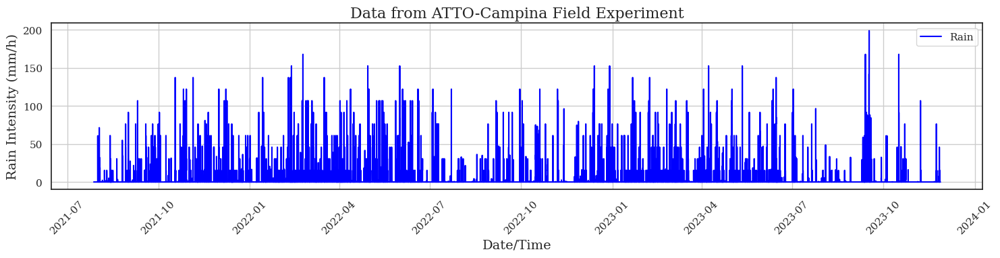

In [140]:
# Filter the data from...
dateini = '2020-01-01'
datefinal = '2023-12-31'

df_rain_final_filter1 = df_complete.loc[dateini:datefinal]

# Create figure and axes
fig, ax = plt.subplots(figsize=(15, 4))

# Plot the df_disdrometer_joss_filter time series with markers and color
ax.plot(df_rain_final_filter1.index, df_rain_final_filter1['Rain'], color='blue', label='Rain')

# Additional configurations
ax.set_xlabel('Date/Time', fontsize=14)
ax.set_ylabel('Rain Intensity (mm/h)', fontsize=14)
ax.set_title('Data from ATTO-Campina Field Experiment', fontsize=16)
ax.legend()

# Add grid lines
ax.grid(True)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


#### Vamos quantificar os missing data (valores ausentes) nos dados do MP3000-A agrupando-os por mês. Para isso, consideramos que o instrumento deve ter realizado medições com time(intervalos) de 30 segundos. Caso contrário, será considerado missing data.

In [141]:
# Check for NaN values in df_complete
nan_counts = df_complete.isnull().sum()
nan_columns = nan_counts[nan_counts > 0].index.tolist()

total_missing_data = nan_counts.sum()
total_present_data = df_complete.size - total_missing_data

if len(nan_columns) > 0:
    print("Columns with NaN data:")
    for column in nan_columns:
        nan_percentage = np.round((nan_counts[column] / df_complete[column].size) * 100, 6)
        print(f"{column}: {nan_counts[column]} NaN data ({nan_percentage}%)")

    # Imprima a contagem total
    total_percentage = np.round((total_missing_data / df_complete.size) * 100, 3)
    print("\nTotal NaN Data:", total_missing_data, f"({total_percentage}%)")
    print("Total Present Data:", total_present_data)
else:
    print("No NaN data in df_complete.")


Columns with NaN data:
Tamb_k: 135302 NaN data (11.020753%)
Rh_percent: 135302 NaN data (11.020753%)
Pres_mb: 135302 NaN data (11.020753%)
Tir_K: 135302 NaN data (11.020753%)
DataQuality: 135302 NaN data (11.020753%)
Az_deg: 135310 NaN data (11.021404%)
El_deg: 135310 NaN data (11.021404%)
TkBB_K: 135310 NaN data (11.021404%)
Ch_22_234: 136385 NaN data (11.108966%)
Ch_22_500: 136379 NaN data (11.108477%)
Ch_23_034: 136391 NaN data (11.109455%)
Ch_23_834: 136400 NaN data (11.110188%)
Ch_25_000: 136400 NaN data (11.110188%)
Ch_26_234: 136391 NaN data (11.109455%)
Ch_28_000: 136389 NaN data (11.109292%)
Ch_30_000: 148687 NaN data (12.111001%)
Ch_51_248: 136251 NaN data (11.098051%)
Ch_51_760: 136244 NaN data (11.097481%)
Ch_52_280: 135954 NaN data (11.07386%)
Ch_52_804: 135313 NaN data (11.021649%)
Ch_53_336: 135314 NaN data (11.02173%)
Ch_53_848: 135313 NaN data (11.021649%)
Ch_54_400: 135317 NaN data (11.021974%)
Ch_54_940: 135317 NaN data (11.021974%)
Ch_55_500: 135317 NaN data (11.021

Visualizando graficamente os MISSING DATAs

In [142]:
df_complete_copy = df_complete.copy()
# Calcula a diferença entre timestamps consecutivos
time_diff = df_complete_copy.index.to_series().diff()
time_diff = time_diff.fillna(pd.Timedelta(seconds=0))
time_diff_mode = time_diff.mode()
# Extrair apenas o intervalo mais frequente (segundos)
mode_seconds = time_diff_mode.dt.total_seconds().iloc[0]

# Define o limite de tempo para considerar como dados faltantes
# (por exemplo, 40 segundos. Pode ajustar para minutos)
time_limit = pd.Timedelta(seconds=33)

# Identifica os índices onde há dados faltantes
missing_data_indices = time_diff[time_diff > time_limit].index

# Adiciona uma coluna ao DataFrame indicando dados faltantes
df_complete_copy['MissingData'] = 0
df_complete_copy.loc[missing_data_indices, 'MissingData'] = 1

# Agrupa o DataFrame por ano/mês
grouped_df = df_complete_copy.resample('M')

# Inicialize listas para armazenar os resultados
months = []
total_missing_data_list = []
total_present_data_list = []

# Verifique e imprima dados ausentes para cada grupo
for group, group_df in grouped_df:
    nan_counts = group_df['MissingData'].sum()
    total_missing_data = nan_counts.sum()
    total_present_data = group_df.size - total_missing_data

    months.append(group.strftime('%Y-%m'))
    total_missing_data_list.append(total_missing_data)
    total_present_data_list.append(total_present_data)

#DataFrame com os resultados
result_df = pd.DataFrame({
    'Mês': months,
    'Total Missing Data': total_missing_data_list,
    'Total Present Data': total_present_data_list
})

#coluna com a porcentagem de dados ausentes em relação ao total
result_df['Missing Data (%)'] = ((result_df['Total Missing Data'] / (result_df['Total Missing Data'] + result_df['Total Present Data'])) * 100).round(2).astype(str) + ' %'


<ipython-input-142-78106fd77e83>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  grouped_df = df_complete_copy.resample('M')


In [143]:
result_df['Total Missing Data'].sum()

1227701

In [144]:
result_df['Total Present Data'].sum()

44197273

In [145]:
result_df['Total Present Data'].sum() / (result_df['Total Missing Data'].sum() + result_df['Total Present Data'].sum()) * 100

97.29729949872949

In [146]:
result_df['Total Missing Data'].sum() / (result_df['Total Missing Data'].sum() + result_df['Total Present Data'].sum()) * 100

2.7027005012705123

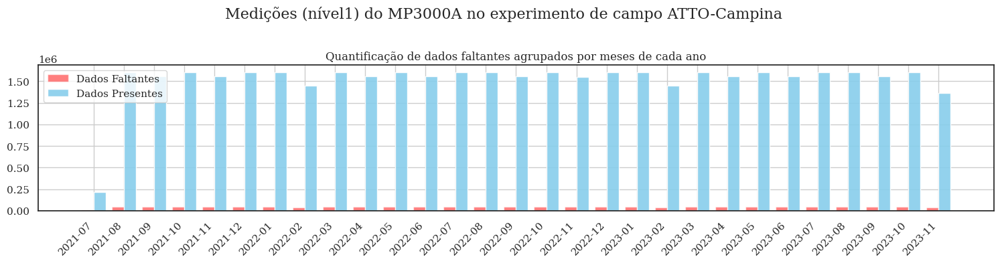

In [147]:
# Configurar a figura para o gráfico de barras empilhadas
fig1, ax1 = plt.subplots(figsize=(15, 4))

# Calcular a largura de cada barra
bar_width = 0.4

# Definir os índices para as barras
ind1 = np.arange(len(months))
ind2 = [x + bar_width for x in ind1]  # Ajustar a posição das barras para colocá-las lado a lado

# Gráfico de barras empilhadas com destaque para dados faltantes
p1 = ax1.bar(ind1, total_missing_data_list, bar_width, label='Dados Faltantes', color='red', alpha=0.5)
p2 = ax1.bar(ind2, total_present_data_list, bar_width, label='Dados Presentes', color='skyblue', alpha=0.9)

ax1.set_title('Quantificação de dados faltantes agrupados por meses de cada ano')
ax1.set_xticks(ind1 + bar_width / 2)  # Definir a posição dos ticks do eixo x
ax1.set_xticklabels(months, rotation=45, ha='right')
ax1.legend()

# Adicionando grade ao gráfico de barras
ax1.grid(True)

# Adicionar título geral
fig1.suptitle('Medições (nível1) do MP3000A no experimento de campo ATTO-Campina', fontsize=16)

# Ajustar layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Exibir gráfico
plt.show()


In [148]:
# Criar novas colunas para receber os dados de chuva convertidos de (mm/h) para (mm)
df_complete['Raingauge_RR_mm_min'] = 0
df_complete['Joss_RR_mm_min'] = 0
df_complete['Pars_RR_mm_min'] = 0
df_complete['Mask_RR_mm_min'] = 0

# Somente se Raingauge_RR >= 0.1
df_complete.loc[df_complete['Raingauge_RR'] > 0, 'Raingauge_RR_mm_min'] = df_complete['Raingauge_RR'] / 60

# Somente se Joss_RR_mm_h >= 0.1
df_complete.loc[df_complete['Joss_RR'] > 0, 'Joss_RR_mm_min'] = (df_complete['Joss_RR'] / 60)

# Somente se Pars_RR_mm_h >= 0.1
df_complete.loc[df_complete['Pars_RR'] > 0, 'Pars_RR_mm_min'] = (df_complete['Pars_RR'] / 60)

# Somente se Rain >= 0.1
df_complete.loc[(df_complete['Rain'] >= 0.1), 'Mask_RR_mm_min'] = (df_complete['Rain'] / 60)


<ipython-input-148-c6a3118569da>:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.254 0.254 0.508 ... 0.254 0.254 0.254]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_complete.loc[df_complete['Raingauge_RR'] > 0, 'Raingauge_RR_mm_min'] = df_complete['Raingauge_RR'] / 60
<ipython-input-148-c6a3118569da>:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.29179667 0.85272333 1.0114     ... 0.00182    0.00172833 0.00171   ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_complete.loc[df_complete['Joss_RR'] > 0, 'Joss_RR_mm_min'] = (df_complete['Joss_RR'] / 60)
<ipython-input-148-c6a3118569da>:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.02442

In [149]:
# Calcular valores estatísticos descritivos de colunas selecionadas:
raingauge_desc = df_complete['Raingauge_RR_mm_min'].loc[df_complete['Raingauge_RR_mm_min'] >= 0.1].describe().round(3)
joss_desc = df_complete['Joss_RR_mm_min'].loc[df_complete['Joss_RR_mm_min'] >= 0.1].describe().round(3)
parsivel_desc = df_complete['Pars_RR_mm_min'].loc[df_complete['Pars_RR_mm_min'] >= 0.1].describe().round(3)
mask_desc = df_complete['Mask_RR_mm_min'].loc[df_complete['Mask_RR_mm_min'] >= 0.1].describe().round(3)


#DataFrame para exibir os resultados
stats_df = pd.DataFrame({
    'Raingauge_RR_mm_min': raingauge_desc,
    'Joss_RR_mm_min': joss_desc,
    'Pars_RR_mm_min': parsivel_desc,
    'Mask_RR_mm_min': mask_desc
})

# Exibir a tabela
print(stats_df)


       Raingauge_RR_mm_min  Joss_RR_mm_min  Pars_RR_mm_min  Mask_RR_mm_min
count            13305.000       11215.000       10269.000       17247.000
mean                 0.424           0.385           0.379           0.400
std                  0.345           0.320           0.358           0.332
min                  0.254           0.100           0.100           0.100
25%                  0.254           0.152           0.143           0.254
50%                  0.254           0.271           0.239           0.254
75%                  0.508           0.488           0.463           0.508
max                  2.794           3.311           2.657           3.311


In [150]:
import pandas as pd

# Supondo que você tenha um DataFrame chamado df
colunas_necessarias = [

       'Tamb_k', 'Rh_percent', 'Pres_mb', 'Tir_K', 'Ch_22_234', 'Ch_22_500', 'Ch_23_034', 'Ch_23_834',
       'Ch_25_000', 'Ch_26_234', 'Ch_28_000', 'Ch_30_000', 'Ch_51_248',
       'Ch_51_760', 'Ch_52_280', 'Ch_52_804', 'Ch_53_336', 'Ch_53_848',
       'Ch_54_400', 'Ch_54_940', 'Ch_55_500', 'Ch_56_020', 'Ch_56_660',
       'Ch_57_288', 'Ch_57_964', 'Ch_58_800', 'Raingauge_RR_mm_min',
       'Joss_RR_mm_min', 'Pars_RR_mm_min', 'Mask_RR_mm_min'
]

# Filtrando o DataFrame para conter apenas essas colunas
df_complete_filtered = df_complete[colunas_necessarias]

# Exibindo as primeiras linhas do DataFrame filtrado
print(df_complete_filtered.head())


                     Tamb_k  Rh_percent  Pres_mb   Tir_K  Ch_22_234  \
Datetime                                                              
2021-07-27 18:14:00  294.61       59.31  1008.01  300.23    299.553   
2021-07-27 18:15:00  294.59       58.53  1008.01  300.39    298.661   
2021-07-27 18:16:00  294.57       57.90  1007.81  300.01    298.477   
2021-07-27 18:17:00  294.63       56.98  1007.81  299.91    298.482   
2021-07-27 18:18:00  294.51       56.58  1007.71  299.95    298.006   

                     Ch_22_500  Ch_23_034  Ch_23_834  Ch_25_000  Ch_26_234  \
Datetime                                                                     
2021-07-27 18:14:00    298.792    299.311    299.058    299.195    298.717   
2021-07-27 18:15:00    298.165    298.656    298.803    298.744    298.661   
2021-07-27 18:16:00    298.240    298.745    298.681    298.516    298.735   
2021-07-27 18:17:00    298.250    299.267    298.677    298.834    298.729   
2021-07-27 18:18:00    298.030    

In [151]:
df_complete_filtered.columns

Index(['Tamb_k', 'Rh_percent', 'Pres_mb', 'Tir_K', 'Ch_22_234', 'Ch_22_500',
       'Ch_23_034', 'Ch_23_834', 'Ch_25_000', 'Ch_26_234', 'Ch_28_000',
       'Ch_30_000', 'Ch_51_248', 'Ch_51_760', 'Ch_52_280', 'Ch_52_804',
       'Ch_53_336', 'Ch_53_848', 'Ch_54_400', 'Ch_54_940', 'Ch_55_500',
       'Ch_56_020', 'Ch_56_660', 'Ch_57_288', 'Ch_57_964', 'Ch_58_800',
       'Raingauge_RR_mm_min', 'Joss_RR_mm_min', 'Pars_RR_mm_min',
       'Mask_RR_mm_min'],
      dtype='object')

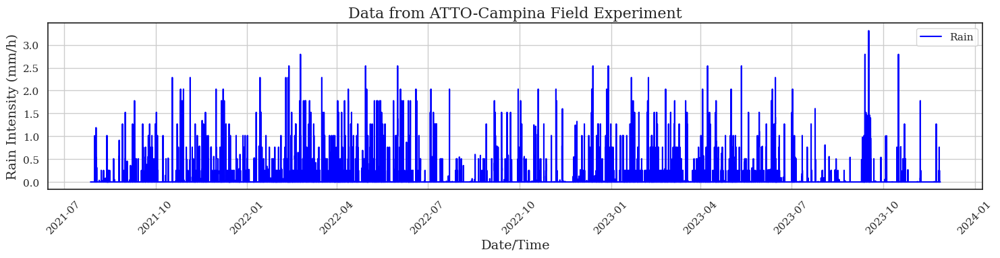

In [152]:
df_rain_final_filter1 = df_complete_filtered.copy()

# Create figure and axes
fig, ax = plt.subplots(figsize=(15, 4))

# Plot the df_disdrometer_joss_filter time series with markers and color
ax.plot(df_rain_final_filter1.index, df_rain_final_filter1['Mask_RR_mm_min'], color='blue', label='Rain')

# Additional configurations
ax.set_xlabel('Date/Time', fontsize=14)
ax.set_ylabel('Rain Intensity (mm/h)', fontsize=14)
ax.set_title('Data from ATTO-Campina Field Experiment', fontsize=16)
ax.legend()

# Add grid lines
ax.grid(True)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


In [153]:
# Garantir que o índice seja do tipo Datetime
if not isinstance(df_complete_filtered.index, pd.DatetimeIndex):
    raise ValueError("O índice do dataframe deve ser do tipo DatetimeIndex.")

# Definir as colunas que receberão a soma na reamostragem
sum_columns = ['Raingauge_RR_mm_min', 'Joss_RR_mm_min', 'Pars_RR_mm_min', 'Mask_RR_mm_min']

# Definir as colunas que receberão a média na reamostragem
mean_columns = [
    'Tamb_k', 'Rh_percent', 'Pres_mb', 'Tir_K', 'Ch_22_234', 'Ch_22_500',
    'Ch_23_034', 'Ch_23_834', 'Ch_25_000', 'Ch_26_234', 'Ch_28_000',
    'Ch_30_000', 'Ch_51_248', 'Ch_51_760', 'Ch_52_280', 'Ch_52_804',
    'Ch_53_336', 'Ch_53_848', 'Ch_54_400', 'Ch_54_940', 'Ch_55_500',
    'Ch_56_020', 'Ch_56_660', 'Ch_57_288', 'Ch_57_964', 'Ch_58_800'
]

# Realizar a reamostragem
#df_new_complete_filtered = pd.DataFrame()

# Aplicar soma para as colunas de soma
df_sum = df_complete_filtered[sum_columns].resample('1H').sum()

# Aplicar média para as colunas de média
df_mean = df_complete_filtered[mean_columns].resample('1H').mean()

# Combinar os dois dataframes
df_complete_filtered_final = pd.concat([df_mean, df_sum], axis=1)

# Configurar o índice do dataframe reamostrado como 'Datetime'
df_complete_filtered_final.index.name = 'Datetime'




<ipython-input-153-a987149cb22d>:21: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_sum = df_complete_filtered[sum_columns].resample('1H').sum()
<ipython-input-153-a987149cb22d>:24: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_mean = df_complete_filtered[mean_columns].resample('1H').mean()


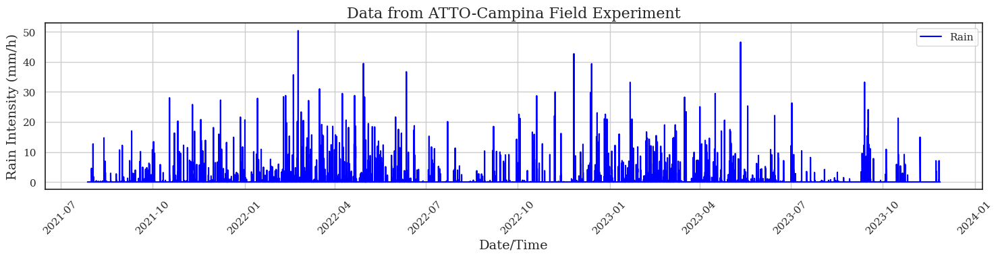

In [154]:
# Filter the data from...
dateini = '2020-01-01'
datefinal = '2023-12-31'

df_rain_final_filter1 = df_complete_filtered_final.loc[dateini:datefinal]

# Create figure and axes
fig, ax = plt.subplots(figsize=(15, 4))

# Plot the df_disdrometer_joss_filter time series with markers and color
ax.plot(df_rain_final_filter1.index, df_rain_final_filter1['Mask_RR_mm_min'], color='blue', label='Rain')

# Additional configurations
ax.set_xlabel('Date/Time', fontsize=14)
ax.set_ylabel('Rain Intensity (mm/h)', fontsize=14)
ax.set_title('Data from ATTO-Campina Field Experiment', fontsize=16)
ax.legend()

# Add grid lines
ax.grid(True)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


In [155]:
# Definir as datas inicial e final do período a ser substituído
dateini = '2020-07-01'
datefinal = '2021-07-31'

# Criar uma cópia da coluna 'Mask_RR_mm_min' como 'Rainfall_mmh'
df_complete_filtered_final['Rainfall_mmh'] = df_complete_filtered_final['Mask_RR_mm_min']

# Garantir que o índice seja do tipo DatetimeIndex
if not isinstance(df_complete_filtered_final.index, pd.DatetimeIndex):
    raise ValueError("O índice do dataframe deve ser do tipo DatetimeIndex.")

# Filtrar o período para substituição
mask_period = (df_complete_filtered_final.index >= dateini) & (df_complete_filtered_final.index <= datefinal)

# Função para obter o valor correspondente de 2023, se existir
def get_replacement_value(row):
    try:
        # Substituir pelo valor correspondente no mesmo dia e horário de 2023
        return df_complete_filtered_final.loc[row.name.replace(year=2022), 'Mask_RR_mm_min']
    except KeyError:
        # Retornar o valor original caso o índice de 2023 não exista
        return row['Rainfall_mmh']

# Aplicar a substituição com base no índice
df_complete_filtered_final.loc[mask_period, 'Rainfall_mmh'] = (
    df_complete_filtered_final.loc[mask_period]
    .apply(get_replacement_value, axis=1)
)



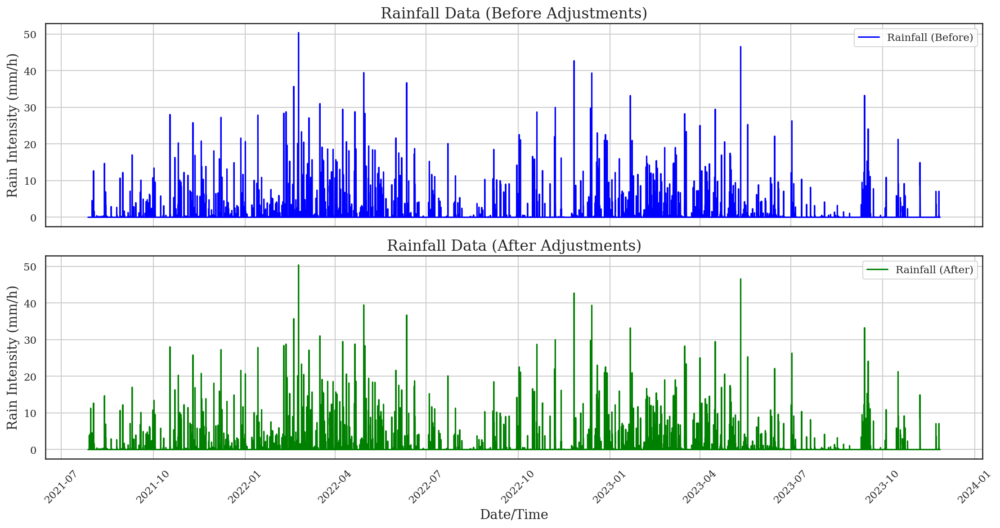

In [156]:
# Filtrar os dados entre as datas especificadas
dateini = '2020-01-01'
datefinal = '2023-12-31'

df_rain_final_filter1 = df_complete_filtered_final.loc[dateini:datefinal]

# Criar a figura e os subplots
fig, axs = plt.subplots(2, 1, figsize=(15, 8), dpi=150, sharex=True)

# Plotagem do "Antes"
axs[0].plot(df_rain_final_filter1.index, df_rain_final_filter1['Mask_RR_mm_min'], color='blue', label='Rainfall (Before)')
axs[0].set_ylabel('Rain Intensity (mm/h)', fontsize=14)
axs[0].set_title('Rainfall Data (Before Adjustments)', fontsize=16)
axs[0].legend()
axs[0].grid(True)

# Plotagem do "Depois"
axs[1].plot(df_rain_final_filter1.index, df_rain_final_filter1['Rainfall_mmh'], color='green', label='Rainfall (After)')
axs[1].set_xlabel('Date/Time', fontsize=14)
axs[1].set_ylabel('Rain Intensity (mm/h)', fontsize=14)
axs[1].set_title('Rainfall Data (After Adjustments)', fontsize=16)
axs[1].legend()
axs[1].grid(True)

# Configurações adicionais
plt.xticks(rotation=45)  # Rotacionar os rótulos do eixo x para melhor legibilidade
plt.tight_layout()       # Ajustar o layout para evitar sobreposição
plt.show()


In [157]:
df_complete_filtered_final.columns

Index(['Tamb_k', 'Rh_percent', 'Pres_mb', 'Tir_K', 'Ch_22_234', 'Ch_22_500',
       'Ch_23_034', 'Ch_23_834', 'Ch_25_000', 'Ch_26_234', 'Ch_28_000',
       'Ch_30_000', 'Ch_51_248', 'Ch_51_760', 'Ch_52_280', 'Ch_52_804',
       'Ch_53_336', 'Ch_53_848', 'Ch_54_400', 'Ch_54_940', 'Ch_55_500',
       'Ch_56_020', 'Ch_56_660', 'Ch_57_288', 'Ch_57_964', 'Ch_58_800',
       'Raingauge_RR_mm_min', 'Joss_RR_mm_min', 'Pars_RR_mm_min',
       'Mask_RR_mm_min', 'Rainfall_mmh'],
      dtype='object')

In [158]:
# Definir as datas inicial e final do período a ser substituído
dateini = '2021-11-30'
datefinal = '2022-01-11'

# Garantir que o índice seja do tipo DatetimeIndex
if not isinstance(df_complete_filtered_final.index, pd.DatetimeIndex):
    raise ValueError("O índice do dataframe deve ser do tipo DatetimeIndex.")

# Lista de colunas a serem substituídas
columns_to_replace = [
    'Tamb_k', 'Rh_percent', 'Pres_mb', 'Tir_K', 'Ch_22_234', 'Ch_22_500',
    'Ch_23_034', 'Ch_23_834', 'Ch_25_000', 'Ch_26_234', 'Ch_28_000',
    'Ch_30_000', 'Ch_51_248', 'Ch_51_760', 'Ch_52_280', 'Ch_52_804',
    'Ch_53_336', 'Ch_53_848', 'Ch_54_400', 'Ch_54_940', 'Ch_55_500',
    'Ch_56_020', 'Ch_56_660', 'Ch_57_288', 'Ch_57_964', 'Ch_58_800'
]

# Criar novas colunas para armazenar os valores substituídos
for col in columns_to_replace:
    df_complete_filtered_final[f'new_{col}'] = df_complete_filtered_final[col]

# Filtrar o período para substituição
mask_period = (df_complete_filtered_final.index >= dateini) & (df_complete_filtered_final.index <= datefinal)

# Função para obter o valor correspondente de 2022 ou 2023
def get_replacement_value(row, col):
    try:
        # Tentar obter o valor de 2023
        value_2023 = df_complete_filtered_final.loc[row.name.replace(year=2023), col]
        return value_2023
    except KeyError:
        try:
            # Se 2023 não existir, tentar obter o valor de 2022
            value_2022 = df_complete_filtered_final.loc[row.name.replace(year=2022), col]
            return value_2022
        except KeyError:
            # Caso nenhum exista, retornar o valor original
            return row[col]

# Aplicar a substituição para cada coluna no período especificado
for col in columns_to_replace:
    df_complete_filtered_final.loc[mask_period, f'new_{col}'] = (
        df_complete_filtered_final.loc[mask_period]
        .apply(lambda row: get_replacement_value(row, col), axis=1)
    )

# Visualizar as alterações realizadas
#df_complete_filtered_final.loc[mask_period, [f'new_{col}' for col in columns_to_replace]].head()


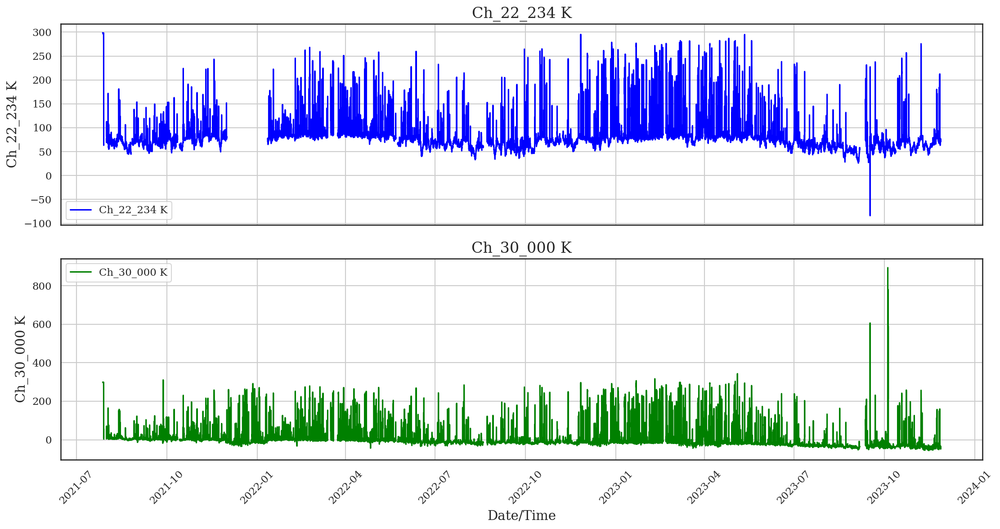

In [159]:
# Filtrar os dados entre as datas especificadas
dateini = '2020-01-01'
datefinal = '2023-12-31'

df_rain_final_filter1 = df_complete_filtered_final.loc[dateini:datefinal]

# Criar a figura e os subplots
fig, axs = plt.subplots(2, 1, figsize=(15, 8), dpi=150, sharex=True)

# Plotagem do "Antes"
axs[0].plot(df_rain_final_filter1.index, df_rain_final_filter1['Ch_22_234'], color='blue', label='Ch_22_234 K')
axs[0].set_ylabel('Ch_22_234 K', fontsize=14)
axs[0].set_title('Ch_22_234 K', fontsize=16)
axs[0].legend()
axs[0].grid(True)

# Plotagem do "Depois"
axs[1].plot(df_rain_final_filter1.index, df_rain_final_filter1['new_Ch_30_000'], color='green', label='Ch_30_000 K')
axs[1].set_xlabel('Date/Time', fontsize=14)
axs[1].set_ylabel('Ch_30_000 K', fontsize=14)
axs[1].set_title('Ch_30_000 K', fontsize=16)
axs[1].legend()
axs[1].grid(True)

# Configurações adicionais
plt.xticks(rotation=45)  # Rotacionar os rótulos do eixo x para melhor legibilidade
plt.tight_layout()       # Ajustar o layout para evitar sobreposição
plt.show()


In [160]:
# Definir as colunas de interesse
columns_of_interest = [
    'new_Tamb_k', 'new_Rh_percent', 'new_Pres_mb', 'new_Tir_K', 'new_Ch_22_234', 'new_Ch_22_500',
    'new_Ch_23_034', 'new_Ch_23_834', 'new_Ch_25_000', 'new_Ch_26_234', 'new_Ch_28_000', 'new_Ch_30_000',
    'new_Ch_51_248', 'new_Ch_51_760', 'new_Ch_52_280', 'new_Ch_52_804', 'new_Ch_53_336', 'new_Ch_53_848',
    'new_Ch_54_400', 'new_Ch_54_940', 'new_Ch_55_500', 'new_Ch_56_020', 'new_Ch_56_660', 'new_Ch_57_288',
    'new_Ch_57_964', 'new_Ch_58_800', 'Mask_RR_mm_min', 'Rainfall_mmh'
]

# Filtrar o DataFrame para manter apenas as colunas de interesse e reorganizá-las
df_filtered_reordered = df_complete_filtered_final[columns_of_interest]




In [161]:
# Visualizar as primeiras linhas do DataFrame com as colunas reorganizadas
df_filtered_reordered.head(n=5)

,new_Tamb_k,new_Rh_percent,new_Pres_mb,new_Tir_K,new_Ch_22_234,new_Ch_22_500,new_Ch_23_034,new_Ch_23_834,new_Ch_25_000,new_Ch_26_234,...,new_Ch_54_400,new_Ch_54_940,new_Ch_55_500,new_Ch_56_020,new_Ch_56_660,new_Ch_57_288,new_Ch_57_964,new_Ch_58_800,Mask_RR_mm_min,Rainfall_mmh
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-07-27 18:00:00,294.946522,55.664565,1007.527391,300.105435,298.461696,298.377630,298.679326,298.544217,298.500065,298.564957,...,299.575196,299.649739,299.555804,299.520826,299.671000,299.416978,299.607913,299.418543,0.0,0.0
2021-07-27 19:00:00,295.071731,54.720962,1006.885000,300.469615,298.509308,298.507500,298.757942,298.618288,298.732077,298.645288,...,299.629846,299.708885,299.567250,299.863654,299.761442,299.678558,299.738231,299.784135,0.0,0.0
2021-07-27 20:00:00,295.091667,55.201500,1006.325000,300.736000,298.624933,298.591200,298.920800,298.747850,298.779467,298.751300,...,299.867067,299.794883,299.883500,299.937283,299.907367,299.792733,299.972033,300.036833,0.0,0.0
2021-07-27 21:00:00,295.208667,58.422000,1006.286667,300.865833,298.585850,298.437383,298.824467,298.718900,298.754450,298.637883,...,299.732167,299.818333,299.725767,299.681050,299.883367,299.711917,299.821083,299.879983,0.0,0.0
2021-07-27 22:00:00,295.226500,58.598500,1006.465000,300.751500,298.329983,298.334533,298.673733,298.497600,298.542350,298.450483,...,299.692283,299.806233,299.610367,299.639550,299.782217,299.509117,299.760450,299.991483,0.0,0.0


In [162]:
# Check for NaN values in df_complete
nan_counts = df_filtered_reordered.isnull().sum()
nan_columns = nan_counts[nan_counts > 0].index.tolist()

total_missing_data = nan_counts.sum()
total_present_data = df_filtered_reordered.size - total_missing_data

if len(nan_columns) > 0:
    print("Columns with NaN data:")
    for column in nan_columns:
        nan_percentage = np.round((nan_counts[column] / df_filtered_reordered[column].size) * 100, 6)
        print(f"{column}: {nan_counts[column]} NaN data ({nan_percentage}%)")

    # Imprima a contagem total
    total_percentage = np.round((total_missing_data / df_filtered_reordered.size) * 100, 3)
    print("\nTotal NaN Data:", total_missing_data, f"({total_percentage}%)")
    print("Total Present Data:", total_present_data)
else:
    print("No NaN data in df_complete.")


Columns with NaN data:
new_Tamb_k: 1139 NaN data (5.565872%)
new_Rh_percent: 1139 NaN data (5.565872%)
new_Pres_mb: 1139 NaN data (5.565872%)
new_Tir_K: 1139 NaN data (5.565872%)
new_Ch_22_234: 1156 NaN data (5.648944%)
new_Ch_22_500: 1156 NaN data (5.648944%)
new_Ch_23_034: 1156 NaN data (5.648944%)
new_Ch_23_834: 1156 NaN data (5.648944%)
new_Ch_25_000: 1156 NaN data (5.648944%)
new_Ch_26_234: 1156 NaN data (5.648944%)
new_Ch_28_000: 1156 NaN data (5.648944%)
new_Ch_30_000: 1145 NaN data (5.595192%)
new_Ch_51_248: 1156 NaN data (5.648944%)
new_Ch_51_760: 1156 NaN data (5.648944%)
new_Ch_52_280: 1139 NaN data (5.565872%)
new_Ch_52_804: 1139 NaN data (5.565872%)
new_Ch_53_336: 1139 NaN data (5.565872%)
new_Ch_53_848: 1139 NaN data (5.565872%)
new_Ch_54_400: 1139 NaN data (5.565872%)
new_Ch_54_940: 1139 NaN data (5.565872%)
new_Ch_55_500: 1139 NaN data (5.565872%)
new_Ch_56_020: 1139 NaN data (5.565872%)
new_Ch_56_660: 1139 NaN data (5.565872%)
new_Ch_57_288: 1139 NaN data (5.565872%)
n

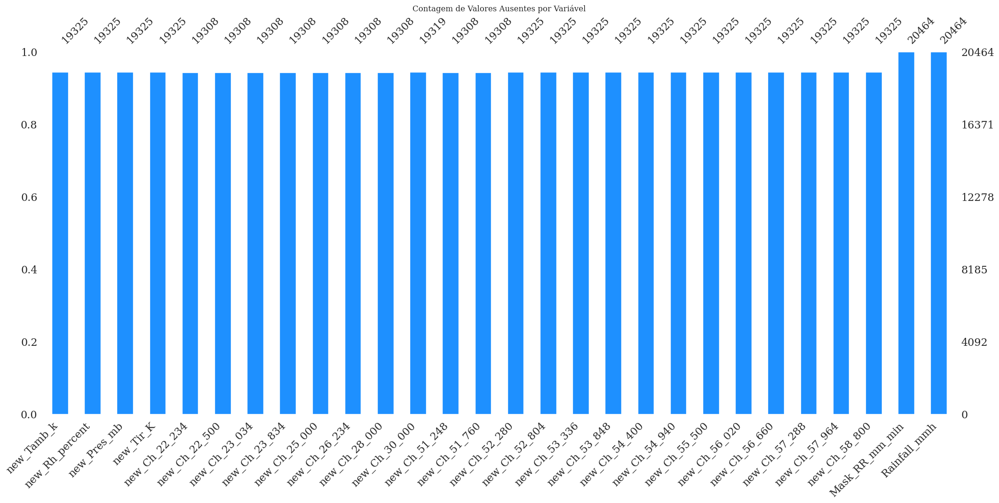

In [163]:
msno.bar(df_filtered_reordered,
         color='dodgerblue')
plt.title('Contagem de Valores Ausentes por Variável')
plt.show()


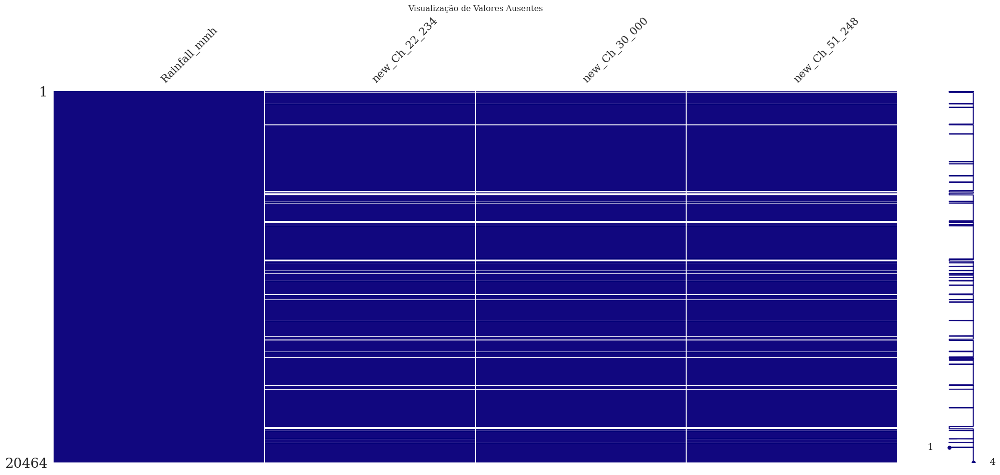

In [164]:
import missingno as msno
%matplotlib inline

# Criar uma matriz de valores ausentes com um título
msno.matrix(df_filtered_reordered[['Rainfall_mmh', 'new_Ch_22_234', 'new_Ch_30_000', 'new_Ch_51_248']],
            color=(0.07, 0.03, 0.5))
plt.title('Visualização de Valores Ausentes')
plt.show()


In [165]:
import numpy as np

# Verificar a existência de valores NaN no DataFrame
nan_counts = df_filtered_reordered.isnull().sum()
nan_columns = nan_counts[nan_counts > 0].index.tolist()

total_missing_data = nan_counts.sum()
total_present_data = df_filtered_reordered.size - total_missing_data

if len(nan_columns) > 0:
    print("Columns with NaN data:")
    for column in nan_columns:
        nan_percentage = np.round((nan_counts[column] / df_filtered_reordered[column].size) * 100, 6)
        print(f"{column}: {nan_counts[column]} NaN data ({nan_percentage}%)")

    # Imprima a contagem total
    total_percentage = np.round((total_missing_data / df_filtered_reordered.size) * 100, 3)
    print("\nTotal NaN Data:", total_missing_data, f"({total_percentage}%)")
    print("Total Present Data:", total_present_data)
else:
    print("No NaN data in df_filtered_reordered.")


Columns with NaN data:
new_Tamb_k: 1139 NaN data (5.565872%)
new_Rh_percent: 1139 NaN data (5.565872%)
new_Pres_mb: 1139 NaN data (5.565872%)
new_Tir_K: 1139 NaN data (5.565872%)
new_Ch_22_234: 1156 NaN data (5.648944%)
new_Ch_22_500: 1156 NaN data (5.648944%)
new_Ch_23_034: 1156 NaN data (5.648944%)
new_Ch_23_834: 1156 NaN data (5.648944%)
new_Ch_25_000: 1156 NaN data (5.648944%)
new_Ch_26_234: 1156 NaN data (5.648944%)
new_Ch_28_000: 1156 NaN data (5.648944%)
new_Ch_30_000: 1145 NaN data (5.595192%)
new_Ch_51_248: 1156 NaN data (5.648944%)
new_Ch_51_760: 1156 NaN data (5.648944%)
new_Ch_52_280: 1139 NaN data (5.565872%)
new_Ch_52_804: 1139 NaN data (5.565872%)
new_Ch_53_336: 1139 NaN data (5.565872%)
new_Ch_53_848: 1139 NaN data (5.565872%)
new_Ch_54_400: 1139 NaN data (5.565872%)
new_Ch_54_940: 1139 NaN data (5.565872%)
new_Ch_55_500: 1139 NaN data (5.565872%)
new_Ch_56_020: 1139 NaN data (5.565872%)
new_Ch_56_660: 1139 NaN data (5.565872%)
new_Ch_57_288: 1139 NaN data (5.565872%)
n

In [166]:
import pandas as pd
import numpy as np

# Criar uma cópia do DataFrame para corrigir os NaN
df_filtered_reordered_no_nan = df_filtered_reordered.copy()

# Obter as colunas com NaN do DataFrame
colunas_nan = df_filtered_reordered.isnull().sum()[df_filtered_reordered.isnull().sum() > 0].index.tolist()

# Corrigir valores NaN com a média diária
print("\nPreenchendo valores NaN com a média diária...")
for coluna in colunas_nan:
    # Agrupar por dia e calcular a média diária para a coluna
    media_diaria = (
        df_filtered_reordered[coluna]
        .groupby(df_filtered_reordered.index.date)
        .transform('mean')  # Calcular a média diária
    )
    # Preencher os NaNs com a média diária correspondente no novo DataFrame
    df_filtered_reordered_no_nan[coluna] = df_filtered_reordered_no_nan[coluna].fillna(media_diaria)

# Caso ainda reste algum NaN, corrigir com a média global da coluna
for coluna in colunas_nan:
    media_global = df_filtered_reordered_no_nan[coluna].mean()
    df_filtered_reordered_no_nan[coluna] = df_filtered_reordered_no_nan[coluna].fillna(media_global)

# Verificar se ainda há valores NaN no novo DataFrame
if df_filtered_reordered_no_nan.isnull().sum().sum() == 0:
    print("Valores NaN preenchidos com sucesso utilizando a média diária e a média global.")
else:
    print("Alguns valores NaN permanecem após a operação.")

# Salvar o DataFrame atualizado em um arquivo CSV com índice e separador
arquivo_saida = "dataset_atto_campina_amazonia_v3.csv"
df_filtered_reordered_no_nan.to_csv(arquivo_saida, index=True, sep=';')

# Exibir uma mensagem confirmando que o novo DataFrame foi salvo
print(f"DataFrame atualizado salvo em '{arquivo_saida}' com índice e separador ';'.")



Preenchendo valores NaN com a média diária...
Valores NaN preenchidos com sucesso utilizando a média diária e a média global.
DataFrame atualizado salvo em 'dataset_atto_campina_amazonia_v3.csv' com índice e separador ';'.


### Vamos ler o Arquivo CSV

In [167]:
file_path = '/content/dataset_atto_campina_amazonia_v3.csv'
dataset_atto_campina_amazonia = pd.read_csv(file_path, sep=';', index_col=0)

# Garantir que o índice seja datetime após carregar o CSV
dataset_atto_campina_amazonia.index = pd.to_datetime(dataset_atto_campina_amazonia.index)


print('Execução do código concluída.')



Execução do código concluída.


In [168]:
dataset_atto_campina_amazonia

,new_Tamb_k,new_Rh_percent,new_Pres_mb,new_Tir_K,new_Ch_22_234,new_Ch_22_500,new_Ch_23_034,new_Ch_23_834,new_Ch_25_000,new_Ch_26_234,...,new_Ch_54_400,new_Ch_54_940,new_Ch_55_500,new_Ch_56_020,new_Ch_56_660,new_Ch_57_288,new_Ch_57_964,new_Ch_58_800,Mask_RR_mm_min,Rainfall_mmh
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-07-27 18:00:00,294.946522,55.664565,1007.527391,300.105435,298.461696,298.377630,298.679326,298.544217,298.500065,298.564957,...,299.575196,299.649739,299.555804,299.520826,299.671000,299.416978,299.607913,299.418543,0.0,0.0
2021-07-27 19:00:00,295.071731,54.720962,1006.885000,300.469615,298.509308,298.507500,298.757942,298.618288,298.732077,298.645288,...,299.629846,299.708885,299.567250,299.863654,299.761442,299.678558,299.738231,299.784135,0.0,0.0
2021-07-27 20:00:00,295.091667,55.201500,1006.325000,300.736000,298.624933,298.591200,298.920800,298.747850,298.779467,298.751300,...,299.867067,299.794883,299.883500,299.937283,299.907367,299.792733,299.972033,300.036833,0.0,0.0
2021-07-27 21:00:00,295.208667,58.422000,1006.286667,300.865833,298.585850,298.437383,298.824467,298.718900,298.754450,298.637883,...,299.732167,299.818333,299.725767,299.681050,299.883367,299.711917,299.821083,299.879983,0.0,0.0
2021-07-27 22:00:00,295.226500,58.598500,1006.465000,300.751500,298.329983,298.334533,298.673733,298.497600,298.542350,298.450483,...,299.692283,299.806233,299.610367,299.639550,299.782217,299.509117,299.760450,299.991483,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-27 05:00:00,295.946000,99.054833,1006.105000,262.234667,71.099417,66.556650,55.457750,50.215650,25.975000,7.951817,...,280.721717,289.997700,292.740467,294.008767,294.556250,294.368383,294.811083,295.513600,0.0,0.0
2023-11-27 06:00:00,295.826500,99.104167,1005.533333,262.678333,70.776750,66.231283,55.062933,49.927817,25.674717,7.764533,...,280.536200,289.904983,292.548383,293.947733,294.434067,294.213383,294.591567,295.323517,0.0,0.0
2023-11-27 07:00:00,295.950167,99.335833,1005.861667,272.742833,73.875933,69.355950,58.413717,53.132550,28.809567,10.948550,...,280.743983,289.694133,292.306617,293.669000,294.124100,293.920900,294.417967,295.112717,0.0,0.0


In [169]:
print(dataset_atto_campina_amazonia.isnull().sum())


new_Tamb_k        0
new_Rh_percent    0
new_Pres_mb       0
new_Tir_K         0
new_Ch_22_234     0
new_Ch_22_500     0
new_Ch_23_034     0
new_Ch_23_834     0
new_Ch_25_000     0
new_Ch_26_234     0
new_Ch_28_000     0
new_Ch_30_000     0
new_Ch_51_248     0
new_Ch_51_760     0
new_Ch_52_280     0
new_Ch_52_804     0
new_Ch_53_336     0
new_Ch_53_848     0
new_Ch_54_400     0
new_Ch_54_940     0
new_Ch_55_500     0
new_Ch_56_020     0
new_Ch_56_660     0
new_Ch_57_288     0
new_Ch_57_964     0
new_Ch_58_800     0
Mask_RR_mm_min    0
Rainfall_mmh      0
dtype: int64


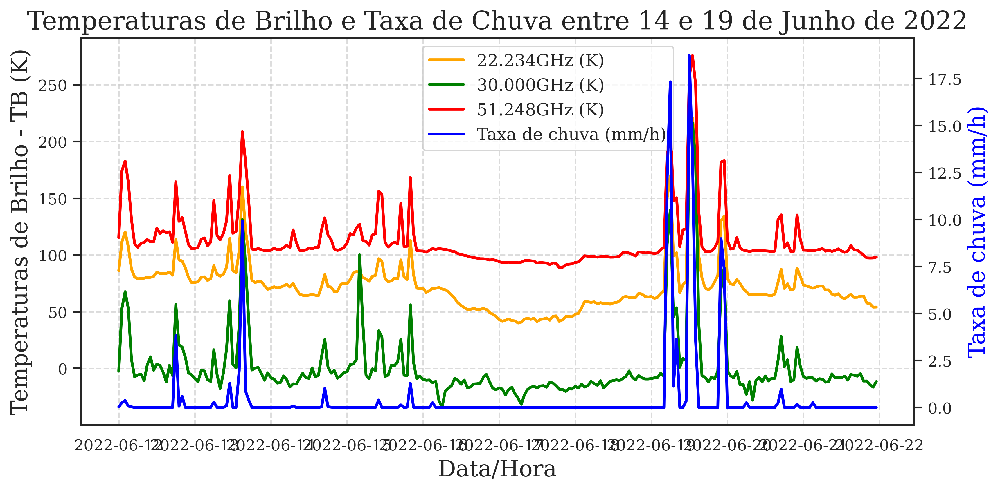

In [170]:
import pandas as pd
import matplotlib.pyplot as plt

# Definir o intervalo de datas
data_inicio = '2022-06-12'
data_final = '2022-06-21'

# Filtrar os dados para o período especificado
df_filtrado = dataset_atto_campina_amazonia[data_inicio:data_final]

# Definir cores para o gráfico
cores = {
    "22.234GHz": 'orange',
    "30.000GHz": 'green',
    "51.248GHz": 'red',
    "Rainfall": 'blue'
}

# Criar a figura e os eixos
fig, ax = plt.subplots(figsize=(10, 5), dpi=350)

# Plotar as temperaturas de brilho no eixo Y da esquerda
ax.plot(df_filtrado.index, df_filtrado["new_Ch_22_234"], label='22.234GHz (K)', linestyle='-', color=cores["22.234GHz"], linewidth=2)
ax.plot(df_filtrado.index, df_filtrado["new_Ch_30_000"], label='30.000GHz (K)', linestyle='-', color=cores["30.000GHz"], linewidth=2)
ax.plot(df_filtrado.index, df_filtrado["new_Ch_51_248"], label='51.248GHz (K)', linestyle='-', color=cores["51.248GHz"], linewidth=2)
ax.set_ylabel('Temperaturas de Brilho - TB (K)', fontsize=16)

# Criar um segundo eixo Y à direita para a taxa de chuva
ax2 = ax.twinx()
ax2.plot(df_filtrado.index, df_filtrado["Rainfall_mmh"], label='Taxa de chuva (mm/h)', linestyle='-', color=cores["Rainfall"], linewidth=2)
ax2.set_ylabel('Taxa de chuva (mm/h)', fontsize=16, color=cores["Rainfall"])

# Adicionar título e rótulos aos eixos
ax.set_xlabel('Data/Hora', fontsize=16)
ax.set_title('Temperaturas de Brilho e Taxa de Chuva entre 14 e 19 de Junho de 2022', fontsize=18)

# Ajustar as legendas
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax.legend(lines + lines2, labels + labels2, loc='upper left', bbox_to_anchor=(0.4, 1), fontsize=12)

# Personalizar a grade de fundo
ax.grid(True, linestyle='--', alpha=0.7)

# Ajustar o layout para evitar sobreposição
plt.tight_layout()

# Exibir o gráfico
plt.show()


In [171]:
# Contar o número de registros com chuvas maiores ou iguais a 0.1 mm/h
num_registros = dataset_atto_campina_amazonia[dataset_atto_campina_amazonia.Rainfall_mmh >= 0.1].shape[0]

print(f'Número de registros com chuvas maiores ou iguais a 0.1 mm/h: {num_registros}')

Número de registros com chuvas maiores ou iguais a 0.1 mm/h: 2151


#### Criando a função para gerar os gráficos de visualização de Outliers

In [172]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm

def plot_data_analysis(df, coluna_interesse, label):
    """
    Função para plotar gráficos de análise de dados.

    :param df: DataFrame contendo os dados
    :param coluna_interesse: Coluna para análise
    :param label: Rótulo correspondente para a coluna
    """
    # Filtrar o DataFrame para incluir apenas registros onde Rainfall_mmhh >= 0.1
    df_filtered = df.loc[df['Rainfall_mmh'] >= 0.1].copy()

    # Configurar o tamanho da figura para os subplots e a largura das colunas
    fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10), dpi=300,
                            gridspec_kw={'width_ratios': [3, 1, 5]})

    # Rótulos para as colunas (adicionado somente ao topo das linhas)
    axs[0, 0].set_title('(a) Antes', fontsize=16, fontweight='bold')
    axs[0, 1].set_title('(b) Antes', fontsize=16, fontweight='bold')
    axs[0, 2].set_title('(c) Antes', fontsize=16, fontweight='bold')

    axs[1, 0].set_title('(d) Depois', fontsize=16, fontweight='bold')
    axs[1, 1].set_title('(e) Depois', fontsize=16, fontweight='bold')
    axs[1, 2].set_title('(f) Depois', fontsize=16, fontweight='bold')

    # Calcular os percentis para identificar outliers
    if coluna_interesse == 'Rainfall_mmh':
        lower_bound = df_filtered[coluna_interesse].quantile(0.001)
        upper_bound = df_filtered[coluna_interesse].quantile(0.999)
    else:
        lower_bound = df_filtered[coluna_interesse].quantile(0.004)
        upper_bound = df_filtered[coluna_interesse].quantile(0.996)

    # Criar DataFrame sem outliers
    df_no_outliers = df_filtered[(df_filtered[coluna_interesse] >= lower_bound) & (df_filtered[coluna_interesse] <= upper_bound)]

    # Antes da remoção de outliers
    # Histograma e Curva de Distribuição Normal
    sns.histplot(df_filtered[coluna_interesse], bins=30, kde=False, stat='density', ax=axs[0, 0], color='skyblue', edgecolor='black')

    # Calcular a média e o desvio padrão para a distribuição normal
    mean = df_filtered[coluna_interesse].mean()
    std = df_filtered[coluna_interesse].std()

    # Criar uma faixa de valores para a curva de distribuição normal
    xmin, xmax = axs[0, 0].get_xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mean, std)

    # Plotar a curva de distribuição normal
    axs[0, 0].plot(x, p, 'r--', linewidth=2, label='Ajuste normal')

    # Configurações do gráfico de histograma
    axs[0, 0].set_xlabel(label, fontsize=16)
    axs[0, 0].set_ylabel('Freq. relativa', fontsize=16)
    axs[0, 0].legend()

    # Gráfico de Caixa (Boxplot) na vertical
    sns.boxplot(y=df_filtered[coluna_interesse], ax=axs[0, 1], color='lightcoral', width=0.5, fliersize=5)
    axs[0, 1].set_xlabel('', fontsize=16)
    axs[0, 1].set_ylabel(label, fontsize=16)

    # Identificar os outliers para o gráfico de dispersão
    outliers = (df_filtered[coluna_interesse] < lower_bound) | (df_filtered[coluna_interesse] > upper_bound)

    # Plotar os pontos normais e os outliers
    axs[0, 2].scatter(df_filtered.index[~outliers], df_filtered[coluna_interesse][~outliers], alpha=0.8, color='blue', edgecolor='blue', marker='o', facecolors='none', label='')
    axs[0, 2].scatter(df_filtered.index[outliers], df_filtered[coluna_interesse][outliers], alpha=0.5, color='red', edgecolor='red', marker='o', label='Potenciais outliers')

    # Configurações do gráfico de dispersão
    axs[0, 2].set_xlabel('Data/hora (h)', fontsize=16)
    axs[0, 2].set_ylabel(label, fontsize=16)
    axs[0, 2].grid(True)
    axs[0, 2].legend()

    # Rotacionar as etiquetas do eixo x
    axs[0, 2].set_xticks(axs[0, 2].get_xticks())  # Garantir que os ticks estejam definidos
    axs[0, 2].set_xticklabels(axs[0, 2].get_xticklabels(), rotation=45, ha='right')

    # Depois da remoção de outliers
    # Histograma e Curva de Distribuição Normal
    sns.histplot(df_no_outliers[coluna_interesse], bins=30, kde=False, stat='density', ax=axs[1, 0], color='skyblue', edgecolor='black')

    # Calcular a média e o desvio padrão para a distribuição normal
    mean_no_outliers = df_no_outliers[coluna_interesse].mean()
    std_no_outliers = df_no_outliers[coluna_interesse].std()

    # Criar uma faixa de valores para a curva de distribuição normal
    xmin_no_outliers, xmax_no_outliers = axs[1, 0].get_xlim()
    x_no_outliers = np.linspace(xmin_no_outliers, xmax_no_outliers, 100)
    p_no_outliers = norm.pdf(x_no_outliers, mean_no_outliers, std_no_outliers)

    # Plotar a curva de distribuição normal
    axs[1, 0].plot(x_no_outliers, p_no_outliers, 'r--', linewidth=2, label='Ajuste normal')

    # Configurações do gráfico de histograma
    axs[1, 0].set_xlabel(label, fontsize=16)
    axs[1, 0].set_ylabel('Freq. relativa', fontsize=16)
    axs[1, 0].legend()

    # Gráfico de Caixa (Boxplot) na vertical
    sns.boxplot(y=df_no_outliers[coluna_interesse], ax=axs[1, 1], color='lightcoral', width=0.5, fliersize=5)
    axs[1, 1].set_xlabel('', fontsize=16)
    axs[1, 1].set_ylabel(label, fontsize=16)

    # Plotar os pontos normais
    axs[1, 2].scatter(df_no_outliers.index, df_no_outliers[coluna_interesse], alpha=0.8, color='blue', edgecolor='blue', marker='o', facecolors='none', label='')

    # Configurações do gráfico de dispersão
    axs[1, 2].set_xlabel('Data/hora (h)', fontsize=16)
    axs[1, 2].set_ylabel(label, fontsize=16)
    axs[1, 2].grid(True)

    # Rotacionar as etiquetas do eixo x
    axs[1, 2].set_xticks(axs[1, 2].get_xticks())  # Garantir que os ticks estejam definidos
    axs[1, 2].set_xticklabels(axs[1, 2].get_xticklabels(), rotation=45, ha='right')

    # Ajustar espaçamento entre os subplots
    plt.tight_layout()
    plt.show()



#### Gerar os gráficos de visualização de Outliers

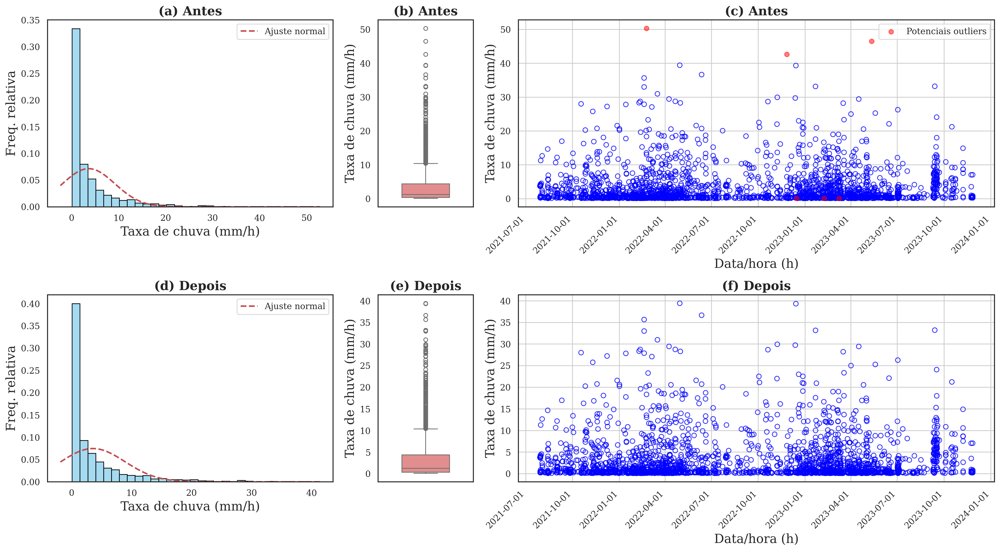

In [173]:
colunas_interesse = ['Rainfall_mmh']
labels = ['Taxa de chuva (mm/h)']

for coluna, label in zip(colunas_interesse, labels):
    plot_data_analysis(dataset_atto_campina_amazonia, coluna, label)

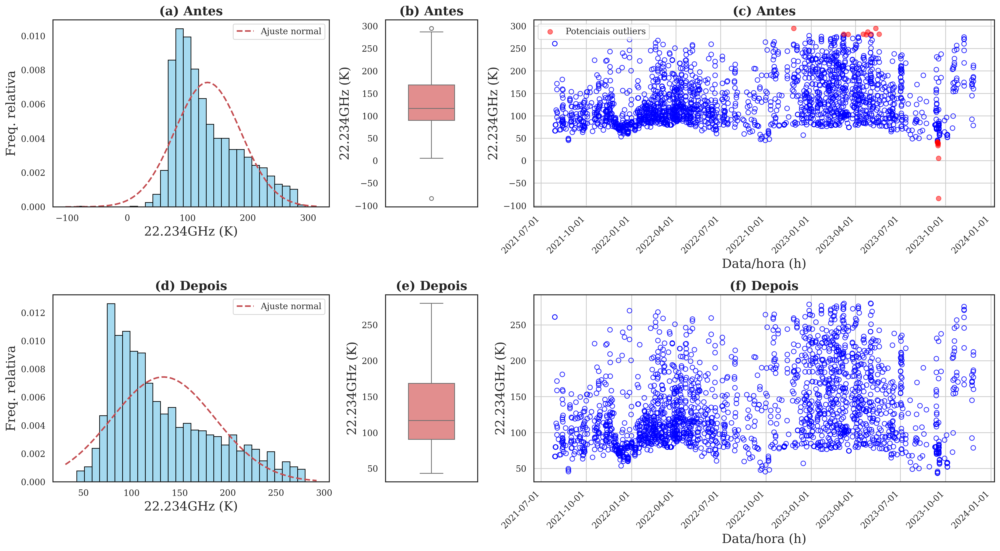

In [174]:

colunas_interesse = ['new_Ch_22_234']
labels = ['22.234GHz (K)']

for coluna, label in zip(colunas_interesse, labels):
    plot_data_analysis(dataset_atto_campina_amazonia, coluna, label)

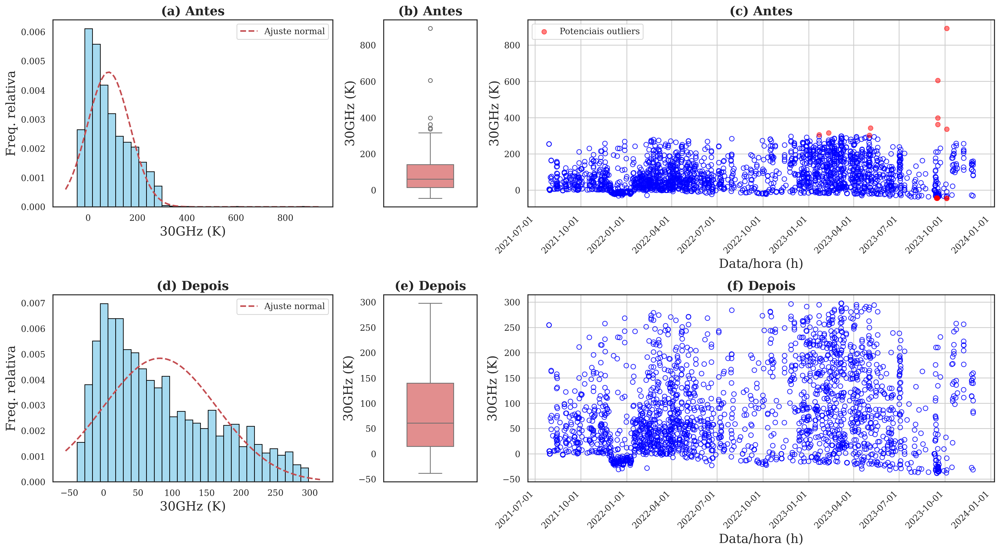

In [175]:
colunas_interesse = ['new_Ch_30_000']
labels = ['30GHz (K)']

for coluna, label in zip(colunas_interesse, labels):
    plot_data_analysis(dataset_atto_campina_amazonia, coluna, label)

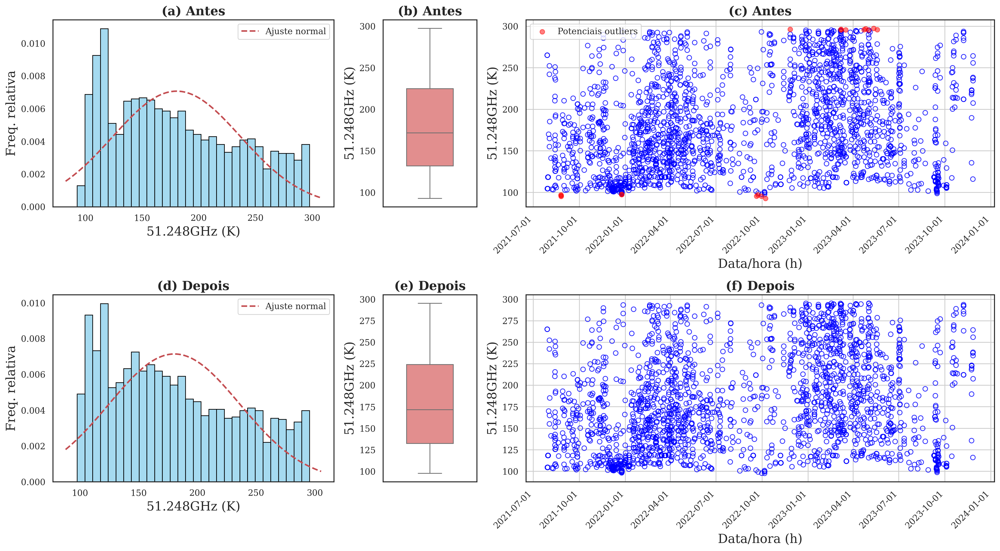

In [176]:
colunas_interesse = ['new_Ch_51_248']
labels = ['51.248GHz (K)']

for coluna, label in zip(colunas_interesse, labels):
    plot_data_analysis(dataset_atto_campina_amazonia, coluna, label)

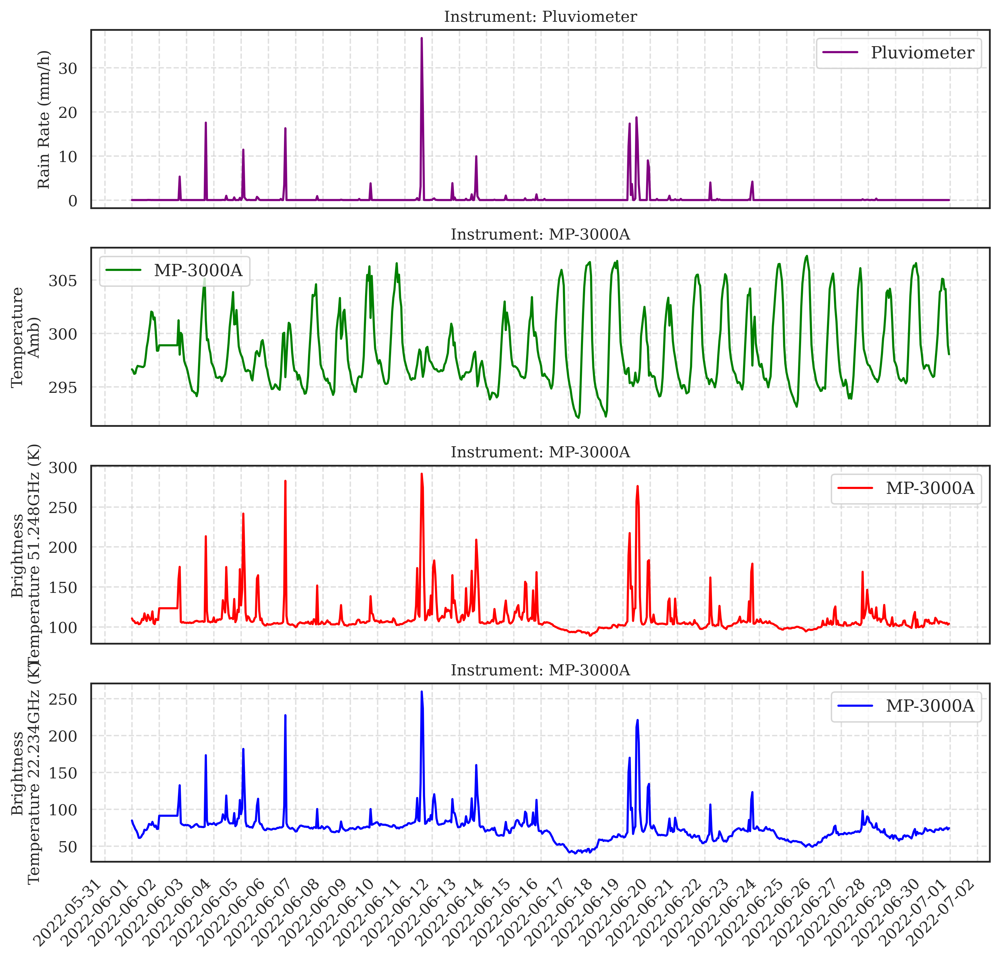

In [177]:
# Definir o intervalo de datas
data_inicio = '2022-06-01'
data_final = '2022-06-30'

# Filtrar os dados para o período especificado
df_filtrado3 = dataset_atto_campina_amazonia[data_inicio:data_final]

# Set the default font family to a serif font
plt.rcParams['font.family'] = 'serif'

# Criar a figura e os subgráficos
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(10, 10), dpi=350, sharex=True)

# Plotar as séries temporais em cada subgráfico
axes[0].plot(df_filtrado3.index, df_filtrado3['Rainfall_mmh'], color='purple', label='Pluviometer')
axes[1].plot(df_filtrado3.index, df_filtrado3['new_Tamb_k'], color='green', label='MP-3000A')
axes[2].plot(df_filtrado3.index, df_filtrado3['new_Ch_51_248'], color='red', label='MP-3000A')
axes[3].plot(df_filtrado3.index, df_filtrado3['new_Ch_22_234'], color='blue', label='MP-3000A')

# Adicionar rótulos nos eixos y
axes[0].set_ylabel('Rain Rate (mm/h)', fontsize=11)
axes[1].set_ylabel('Temperature\nAmb)', fontsize=11)
axes[2].set_ylabel('Brightness\nTemperature 51.248GHz (K)', fontsize=11)
axes[3].set_ylabel('Brightness\nTemperature 22.234GHz (K)', fontsize=11)

# Adicionar títulos nos subgráficos
axes[0].set_title('Instrument: Pluviometer', fontsize=11)
axes[1].set_title('Instrument: MP-3000A', fontsize=11)
axes[2].set_title('Instrument: MP-3000A', fontsize=11)
axes[3].set_title('Instrument: MP-3000A', fontsize=11)

# Adicionar legendas
for ax in axes:
    ax.legend(fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)

# Melhorar a formatação das labels de data no eixo x
axes[-1].xaxis.set_major_locator(plt.matplotlib.dates.DayLocator(interval=1))  # Exibe uma data a cada dia
axes[-1].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d'))

# Girar as labels para melhorar a leitura
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha='right')

# Ajustar layout para evitar sobrecarga nas labels
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Mostrar o gráfico
plt.show()


In [178]:
df_copy = dataset_atto_campina_amazonia.copy()

#

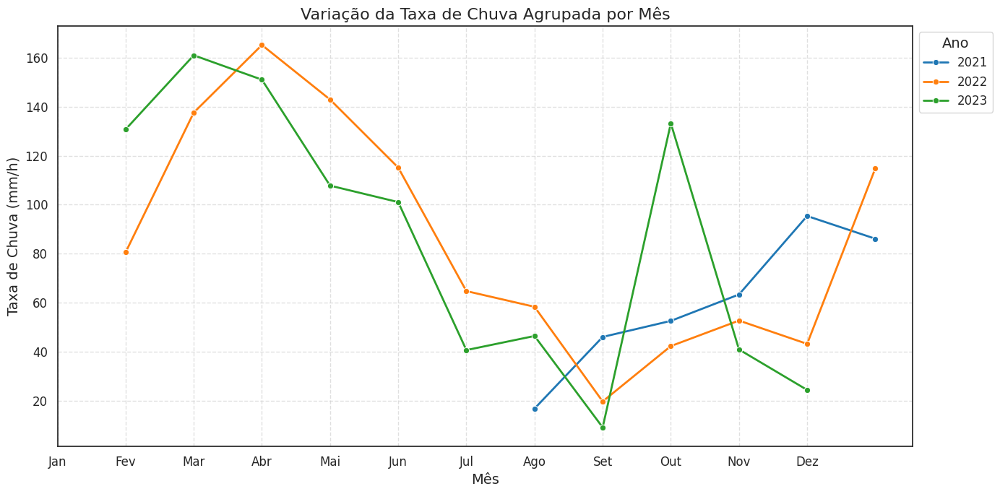

In [185]:
# Agrupar por ano e mês, calculando a soma da taxa de chuva
monthly_rain = df_copy.groupby(['Year', 'Month'])['Rainfall_mmh'].sum().reset_index()

# Criar o gráfico com ajustes
plt.figure(figsize=(14, 7))  # Aumentando o tamanho do gráfico
sns.lineplot(data=monthly_rain, x='Month', y='Rainfall_mmh', hue='Year', marker='o', linewidth=2, palette='tab10')

# Ajustes no gráfico
plt.title('Variação da Taxa de Chuva Agrupada por Mês', fontsize=16)
plt.xlabel('Mês', fontsize=14)
plt.ylabel('Taxa de Chuva (mm/h)', fontsize=14)
plt.xticks(range(0, 12), ['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dez'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

# Melhorando a legenda
plt.legend(title='Ano', fontsize=12, title_fontsize=14, loc='upper left', bbox_to_anchor=(1, 1))

# Ajustes finais de layout
plt.tight_layout()

# Mostrar o gráfico
plt.show()


### **Análise de correlação de variáveis utilizando Regressão Linear**

Aqui vamos aplicar um modelo de regressão linear para entender quais variáveis do nosso conjunto de dados mais influenciam a previsão da taxa de precipitação (Rainfall_mmh). Utilizaremos o método de regressão linear para ajustar o modelo aos dados e, a partir disso, extrairmos os coeficientes de importância de cada variável preditora. Esses coeficientes podem indicar como cada variável impacta a taxa de precipitação, seja de forma positiva ou negativa. Por fim, visualizamos esses coeficientes em um gráfico de barras, facilitando a interpretação do impacto relativo de cada variável na previsão da precipitação. Esta análise é fundamental para determinar quais fatores têm maior relevância na modelagem da precipitação, ajudando a direcionar futuras análises ou ajustes no modelo.

### Vamos normalizar os dados antes aplicando transformação logarítmica
A normalização é uma boa opção quando você tem variáveis com intervalos muito diferentes, como é o caso das temperaturas de brilho (Kelvin) e da taxa de chuva (mm/h). Com a normalização, vamoz trazer todas as variáveis para o mesmo intervalo (geralmente [0, 1]), o que pode melhorar o desempenho de modelos, como LSTM, que são sensíveis a escalas diferentes.

In [181]:
import numpy as np

# Variáveisde interesse para transformação logarítmica
log_cols = ['new_Tamb_k', 'new_Rh_percent', 'new_Pres_mb', 'new_Tir_K',
            'new_Ch_22_234', 'new_Ch_22_500', 'new_Ch_23_034', 'new_Ch_23_834',
            'new_Ch_25_000', 'new_Ch_26_234', 'new_Ch_28_000', 'new_Ch_30_000',
            'new_Ch_51_248', 'new_Ch_51_760', 'new_Ch_52_280', 'new_Ch_52_804',
            'new_Ch_53_336', 'new_Ch_53_848', 'new_Ch_54_400', 'new_Ch_54_940',
            'new_Ch_55_500', 'new_Ch_56_020', 'new_Ch_56_660', 'new_Ch_57_288',
            'new_Ch_57_964', 'new_Ch_58_800', 'Mask_RR_mm_min', 'Rainfall_mmh']

# Aplicando log1p nas variáveis de interesse
df_copy[log_cols] = df_copy[log_cols].apply(np.log1p)

df_copy = df_copy.fillna(df_copy.mean())

# Exibindo as primeiras linhas do DataFrame para verificar as transformações
df_copy.head(n=5)


,new_Tamb_k,new_Rh_percent,new_Pres_mb,new_Tir_K,new_Ch_22_234,new_Ch_22_500,new_Ch_23_034,new_Ch_23_834,new_Ch_25_000,new_Ch_26_234,...,new_Ch_56_020,new_Ch_56_660,new_Ch_57_288,new_Ch_57_964,new_Ch_58_800,Mask_RR_mm_min,Rainfall_mmh,Datetime,Year,Month
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-07-27 18:00:00,5.690179,4.037149,6.916247,5.707460,5.701987,5.701706,5.702713,5.702262,5.702115,5.702331,...,5.705517,5.706017,5.705171,5.705807,5.705177,0.0,0.0,2021-07-27 18:00:00,2021,7
2021-07-27 19:00:00,5.690602,4.020356,6.915609,5.708669,5.702145,5.702139,5.702975,5.702509,5.702889,5.702599,...,5.706657,5.706317,5.706042,5.706240,5.706393,0.0,0.0,2021-07-27 19:00:00,2021,7
2021-07-27 20:00:00,5.690669,4.028943,6.915054,5.709552,5.702531,5.702419,5.703518,5.702942,5.703047,5.702953,...,5.706902,5.706802,5.706421,5.707017,5.707233,0.0,0.0,2021-07-27 20:00:00,2021,7
2021-07-27 21:00:00,5.691064,4.084665,6.915016,5.709983,5.702401,5.701905,5.703197,5.702845,5.702964,5.702575,...,5.706050,5.706723,5.706153,5.706516,5.706711,0.0,0.0,2021-07-27 21:00:00,2021,7
2021-07-27 22:00:00,5.691124,4.087630,6.915193,5.709604,5.701547,5.701562,5.702694,5.702106,5.702256,5.701949,...,5.705912,5.706386,5.705478,5.706314,5.707082,0.0,0.0,2021-07-27 22:00:00,2021,7


Feature: new_Ch_57_288 - Importance Coefficient: 31.56877877992091
Feature: new_Ch_56_020 - Importance Coefficient: 18.487273547411135
Feature: new_Ch_51_760 - Importance Coefficient: 6.4318964164094545
Feature: new_Ch_54_400 - Importance Coefficient: 5.8985493634208765
Feature: new_Ch_57_964 - Importance Coefficient: 5.080805063115968
Feature: new_Ch_23_834 - Importance Coefficient: 2.2188391784453216
Feature: new_Ch_53_848 - Importance Coefficient: 1.446004322645083
Feature: new_Tamb_k - Importance Coefficient: 1.1364745992730791
Feature: new_Ch_30_000 - Importance Coefficient: 0.020113780758223003
Feature: new_Rh_percent - Importance Coefficient: -0.0039043425196745307
Feature: new_Ch_28_000 - Importance Coefficient: -0.006683425472192027
Feature: new_Ch_52_804 - Importance Coefficient: -0.02186632894514578
Feature: new_Ch_26_234 - Importance Coefficient: -0.024986662110196296
Feature: new_Ch_53_336 - Importance Coefficient: -0.2525706846978591
Feature: new_Ch_22_234 - Importance Co

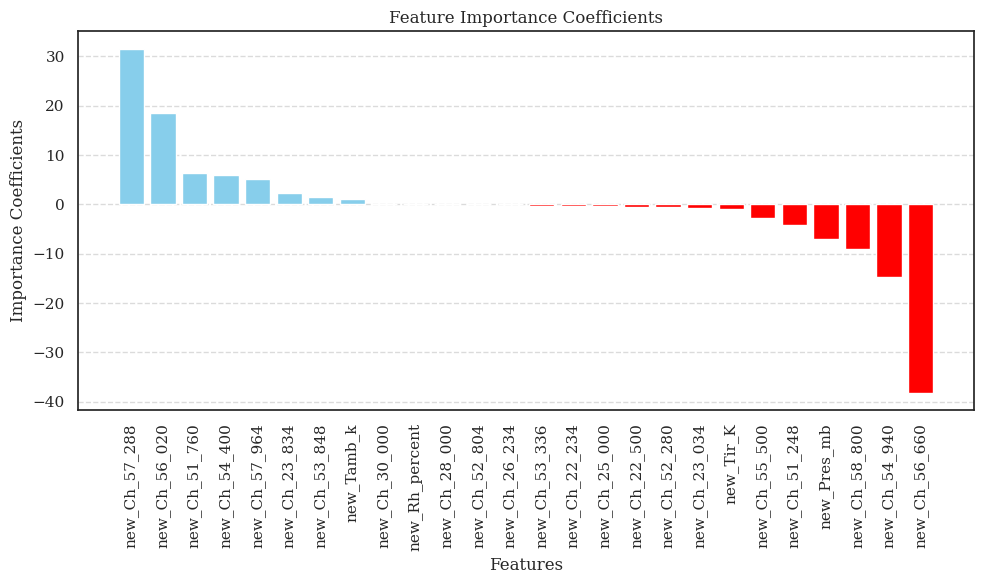

In [186]:
from sklearn.linear_model import LinearRegression

# Criar dataframe para as variáveis preditoras
X1 = df_copy.drop(['Rainfall_mmh', 'Mask_RR_mm_min','Datetime', 'Year', 'Month'], axis=1)  # colunas de características

# Criar dataframe para a variável alvo
y1 = df_copy['Rainfall_mmh']  # coluna alvo

# Definir a fonte padrão como uma fonte serifada
plt.rcParams['font.family'] = 'serif'

# Inicializar e ajustar o modelo de regressão linear
model = LinearRegression()
model.fit(X1, y1)

# Obter os coeficientes de importância e os nomes das características
importance = model.coef_
feature_names = X1.columns  # Supondo que X1 seja um DataFrame pandas com nomes de colunas

# Criar um DataFrame com os coeficientes e os nomes das variáveis
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importance
})

# Ordenar as variáveis pela importância de forma decrescente
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Imprimir o nome da característica e seu coeficiente de importância ordenado
for feature_name, coef in zip(importance_df['Feature'], importance_df['Importance']):
    print(f"Feature: {feature_name} - Importance Coefficient: {coef}")

# Definir as cores das barras (vermelho para coeficientes negativos, azul para positivos)
colors = ['red' if coef < 0 else 'skyblue' for coef in importance_df['Importance']]

# Plotar o gráfico de barras dos coeficientes de importância ordenados
plt.figure(figsize=(10, 6))  # Ajustar o tamanho da figura
plt.bar(importance_df['Feature'], importance_df['Importance'], color=colors)  # Adicionar cores específicas às barras
plt.xlabel('Features')  # Adicionar rótulo ao eixo x
plt.ylabel('Importance Coefficients')  # Adicionar rótulo ao eixo y
plt.title('Feature Importance Coefficients')  # Adicionar título ao gráfico
plt.xticks(rotation=90)  # Rotacionar os rótulos do eixo x para facilitar a leitura
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Adicionar grades ao eixo y
plt.tight_layout()  # Ajustar o layout para evitar cortes
plt.show()


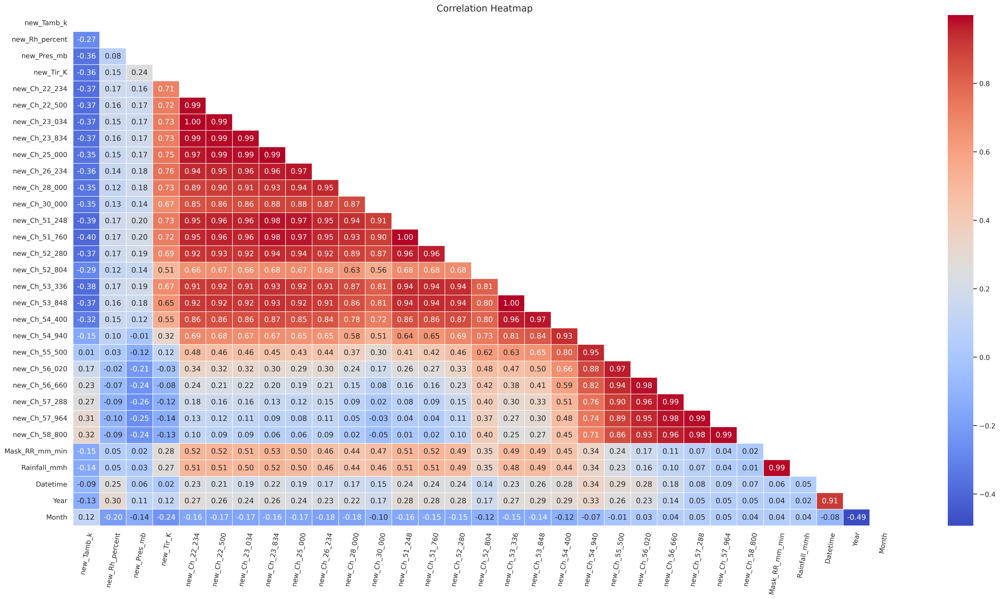

In [183]:
# Calcular a matriz de correlação diretamente em df_final

df_calc_corr = df_copy.loc[((df_copy['Rainfall_mmh'] >= 0.1))].copy()

correlation_matrix = df_calc_corr.corr(method='pearson') #spearman

# Configurar estilo para o gráfico
sns.set(style="white")

# Criar uma máscara para mostrar apenas a metade superior da matriz
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Obter os nomes das variáveis presentes no DataFrame
nomes_variaveis = df_calc_corr.columns

# Criar o gráfico de heatmap
plt.figure(figsize=(30, 15), dpi=350)
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5, mask=mask)
plt.title('Correlation Heatmap', fontsize=15)
#plt.ylabel('Variáveis', fontsize=9)
#plt.xlabel('Variáveis', fontsize=9)

# Definir rótulos personalizados para os eixos Y e X com os nomes das variáveis
plt.yticks(np.arange(len(nomes_variaveis)) + 0.5, nomes_variaveis, fontsize=11, va='center')
plt.xticks(np.arange(len(nomes_variaveis)) + 0.5, nomes_variaveis, fontsize=11, rotation=80, ha='center')

plt.show()


Finalmente, já temos o ponto de partida sobre quais variáveis têm maior influência/relação com a precipitação. Como podemos ver, por exemplo, as variáveis com coeficientes de importância bem altos e positivos, como **new_Ch_22_500 (0.7566) e new_Ch_56_020 (0.6443)**, são basttante influentes no modelo, indicando que têm um impacto positivo no valor de previsão. Em contraste, variáveis com coeficientes negativos, **new_Ch_56_660 (-0.7833) e new_Ch_54_940 (-0.4189)**, exercem uma influência negativa, indicando que, à medida que esses valores aumentam, o valor de previsão diminui. A importância de cada variável foi determinada pelos coeficientes do modelo de regressão linear.

## **Referências**

[1] Meinrat Andreae et al. “**The Amazon Tall Tower Observatory (ATTO): overview of pilot measurements on ecosystem ecology, meteorology, trace gases, and aerosols**”. Em: Atmospheric Chemistry and Physics 15.18 (2015), pp. 10723–10776.

[2] L. J. Cavalcante Neto e A. J Calheiros. “**A study on the impact of data balance on rain fall prediction through artificial neural networks using surface microwave radiometers**”. Em: Latin-American Journal of Computing 11.2 (jul. de 2024), pp. 51–59. url: https: //lajc.epn.edu.ec/index.php/LAJC/article/view/394.

[3] **Radiometrics Corporation. MP3000A Profiler Operator’s Manual**. 2008.

[4] Emad Habib, Witold F Krajewski e Anton Kruger. “**Sampling errors of tipping-bucket raingauge measurements**”. Em: Journal of Hydrologic Engineering 6.2 (2001), pp. 159–166.

[5] S Hochreiter. “**Long Short-term Memory”. Em: Neural Computation MIT-Press (1997)**.

[6] Tanvir Islam, Miguel A Rico-Ramirez, Dawei Han e Prashant K Srivastava. “**A Joss–Waldvogel disdrometer derived rainfall estimation study by collocated tipping bucket and rapid response rain gauges**”. Em: Atmospheric Science Letters 13.2 (2012), pp. 139–150.

[7] Martin Löffler-Mang e Jürg Joss. “**An optical disdrometer for measuring size and velocity of hydrometeors**”. Em: Journal of Atmospheric and Oceanic Technology 17.2 (2000), pp. 130–139.

[8] Qinghua Miao, Baoxiang Pan, Hao Wang, Kuolin Hsu e Soroosh Sorooshian. “**Improving monsoon precipitation prediction using combined convolutional and long short term memory neural network**”. Em: Water 11.5 (2019), p. 977.

[9] **WORLD METEOROLOGICAL ORGANIZATION (WMO). Guide to meteorological instruments and methods of observation**. 7th ed. ed. Geneva, Switzerland: World Meteorological Organization, 2008. OCLC: 288915903. ISBN 978-92-63-10008-5. 11, 12, 65, 66

---

[chollet2018] **Deep Learning with Phyton**. François Chollet. https://livebook.manning.com/book/deep-learning-with-python/

[goodfellow2016] **The Deep Learning Book**. Ian Goodfellow, Yoshua Bengio, Aaron Courville. https://www.deeplearningbook.org/

[graves2012] **Supervised Sequence Labelling with Recurrent Neural Networks**. Alex Graves.

[simplernn2021] **Understanding Simple Recurrent Neural Networks In Keras**. https://machinelearningmastery.com/start-here/

[karpathy2015] **The Unreasonable Effectiveness of Recurrent Neural Networks**. https://karpathy.github.io/2015/05/21/rnn-effectiveness/

[hochreiter1997] **Long Short-Term Memory**, Sepp Hochreiter, Jurgen Schmidhuber. http://www.bioinf.jku.at/publications/older/2604.pdf


[colah2015] **Understanding LSTM Networks**. http://colah.github.io/posts/2015-08-Understanding-LSTMs/

[chung2014] **Empirical Evaluation of Gated Recurrent Neural  Networks on Sequence Modeling**. Junyoung Chung, Caglar Gulcehre, KyungHyun Cho, Yoshua Bengio. https://arxiv.org/pdf/1412.3555.pdf